# Package loading and basic configurations

In [2]:
%load_ext autoreload
%autoreload 2

# load dependencies'
import pandas as pd
import geopandas as gpd

from envirocar import TrackAPI, DownloadClient, BboxSelector, ECConfig, Visualiser, Preprocessing, TrackConverter

# create an initial but optional config and an api client
config = ECConfig()
track_api = TrackAPI(api_client=DownloadClient(config=config))

# Querying enviroCar Tracks

The following cell queries tracks from the enviroCar API. It defines a bbox for the area of Gievenbeck, Münster (Germany) and requests 50 tracks. The result is a GeoDataFrame, which is a geo-extended Pandas dataframe from the GeoPandas library. It contains all information of the track in a flat dataframe format including a specific geometry column. 

In [10]:
bbox = BboxSelector([
    7.554130554199218, # min_x
    51.95590322041212, # min_y
    7.590351104736328, # max_x
    51.97874790276371  # max_y
])


# issue a query
track_df = track_api.get_tracks(bbox=bbox, num_results=10) # requesting 10 tracks inside the bbox
# track_df

# Visualising a single Track

In [11]:
# # Visualizing tracks by their IDs
# by_id = track_df.dissolve(by='track.id')
# by_id.plot(column = 'id', figsize=(8, 10))

%matplotlib qt 

some_track_id = track_df['track.id'].unique()[1]

some_track = track_df[track_df['track.id'] == some_track_id]
# some_track.plot()

visualiser = Visualiser()

visualiser.st_cube_simple(some_track)


Initializing visualisation class


c:\users\sony\documents\studyproject\envirocar-py\envirocar\trajectories\visualisation.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  points['lat'] = points['geometry'].apply(lambda coord: coord.y)
c:\users\sony\documents\studyproject\envirocar-py\envirocar\trajectories\visualisation.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  points['lng'] = points['geometry'].apply(lambda coord: coord.x)
c:\users\sony\documents\studyproject\envirocar-py\envirocar\trajectories\visualisation.py:26: SettingWit

In [3]:
visualiser = Visualiser()
preprocessing = Preprocessing()
track_converter = TrackConverter()

Initializing visualisation class
Initializing pre-processing class
Initializing TrackConverter class


AGGREGATION - AVERAGE FLOWS

In [4]:
bbox = BboxSelector([
    7.564130554199218, # min_x
    51.95590322041212, # min_y
    7.570351104736328, # max_x
    51.97874790276371  # max_y
])

# issue a query
bbox_df = track_api.get_tracks(bbox=bbox, num_results=10) # requesting tracks inside the bbox

#conversion to moving pandas geodataframe format
bbox_mpd_df = track_converter.to_movingpandas(bbox_df)

In [5]:
# Aggregate Function
aggregatedflows = preprocessing.aggregate(bbox_mpd_df, 100, 5, 1000, 100, 5)

# Input Parameters!
# 01 - Moving Pandas GeoDataFrame, 
# 02 - Minimum Length of a Trajectory (to be considered as a Trajectory)
# 03 - Minimum Gap (in minutes) for splitting single Trajectory into more 
# 04 - Maximum distance between significant points 
# 05 - Minimum distance between significant points 
# 06 - Minimum duration (in minutes) required for stop detection

aggregatedflows

Finished creating 10 trajectories
Extracted 10 individual trips from 10 continuous vehicle tracks
Extracting significant points ...
  No. significant points: 456
Clustering significant points ...
  No. clusters: 69
Computing flows ...
Flows ready!


,geometry,weight
0,"LINESTRING (7.59889 51.96560, 7.58899 51.96490)",6
1,"LINESTRING (7.58899 51.96490, 7.58360 51.96085)",7
2,"LINESTRING (7.58360 51.96085, 7.57653 51.95924)",7
3,"LINESTRING (7.57653 51.95924, 7.57013 51.95716)",7
4,"LINESTRING (7.57013 51.95716, 7.56407 51.95430)",5
...,...,...
77,"LINESTRING (7.59889 51.96560, 7.61305 51.96805)",1
78,"LINESTRING (7.61305 51.96805, 7.61773 51.96306)",1
79,"LINESTRING (7.61773 51.96306, 7.61986 51.95596)",1
80,"LINESTRING (7.61986 51.95596, 7.63579 51.95216)",1


In [6]:
import folium 
m = folium.Map(location=[51.96560, 7.59889 ], zoom_start=12, tiles='cartodbpositron')

#Call to function to Plot Aggregated Flows
#Parameters { flows, map object}
visualiser.plot_flows(aggregatedflows, m)

m

ESTIMATE THE AVERAGE FLOW BETWEEN REGIONS!

In [7]:
from shapely.geometry import Point, LineString, Polygon
import movingpandas as mpd
from statistics import mean
import datetime 

bbox = BboxSelector([
    7.504130554199218, # min_x
    51.90590322041212, # min_y
    7.600351104736328, # max_x
    51.99874790276371  # max_y
])
    
# issue a query
bbox_df = track_api.get_tracks(bbox=bbox, num_results=50) # requesting tracks inside the bbox

#conversion to moving pandas geodataframe format
bbox_mpd_df = track_converter.to_movingpandas(bbox_df)

In [8]:
# regions of interest
from_region = Polygon([(7.59, 51.955), (7.59, 51.97), (7.64, 51.97), (7.64, 51.955)])
to_region = Polygon([(7.61, 51.93), (7.61, 51.948), (7.66, 51.948), (7.66, 51.93)])

# function call to get trajectories running between regions
twoway = 1
between_region_trajectories = preprocessing.flow_between_regions(bbox_mpd_df, from_region, to_region, twoway)

Found 22 trajectories moving between provided regions with following details:
Average Distance: 8.68 kms
Maximum Distance: 9.52 kms
Average Duration: 0:18:01 
Maximum Duration: 0:28:01 


In [9]:
# to convert list of trajectories into a trajectory collection object for Aggregation 
regiontrajectories_collection = mpd.TrajectoryCollection(between_region_trajectories, 'track.id')

# aggregating trajectories to have information about average flow
aggregated_trajectories = mpd.TrajectoryCollectionAggregator(regiontrajectories_collection, max_distance=1000, min_distance=1, min_stop_duration=datetime.timedelta(minutes=5))

# extracting in form of flows and as gdf
averageflows_gdf = aggregated_trajectories.get_flows_gdf()
averageflows_gdf

Extracting significant points ...
  No. significant points: 422
Clustering significant points ...
  No. clusters: 17
Computing flows ...
Flows ready!


,geometry,weight
0,"LINESTRING (7.65535 51.93639, 7.64662 51.94291)",9
1,"LINESTRING (7.64662 51.94291, 7.63220 51.93783)",10
2,"LINESTRING (7.63220 51.93783, 7.62441 51.93749)",10
3,"LINESTRING (7.62441 51.93749, 7.61793 51.93537)",11
4,"LINESTRING (7.61793 51.93537, 7.60948 51.93496)",11
5,"LINESTRING (7.60948 51.93496, 7.60240 51.93545)",11
6,"LINESTRING (7.60240 51.93545, 7.60948 51.93496)",15
7,"LINESTRING (7.60948 51.93496, 7.61107 51.94278)",6
8,"LINESTRING (7.61107 51.94278, 7.61668 51.94976)",7
9,"LINESTRING (7.61668 51.94976, 7.60473 51.95063)",7


In [14]:
#Trajectory Collection
mytrajectories = regiontrajectories_collection.trajectories

#Call to function that will create a new map object
region_traj_map = visualiser.create_map(mytrajectories)

#Call to function of Plot Region to plot both 'From' & 'To' regions
#Parameters { region_polygon, map object, color, label }
visualiser.plot_region(from_region, region_traj_map, 'orange', 'From Region')
visualiser.plot_region(to_region, region_traj_map, 'green', 'To Region')

#Call to function to Plot Aggregated Flows
#Parameters { flows, map object}
visualiser.plot_flows(averageflows_gdf, region_traj_map)

#Call to function to Plot Trajectory Collection
#Parameters { trajectory collection, map object, marker radius}
visualiser.plot_trajectories(mytrajectories, region_traj_map, 5) 

region_traj_map

WHICH DAY HAS A DIFFERENT MOVEMENT PATTERN THAN OTHERS?

In [21]:
bbox = BboxSelector([
    7.004130554199218, # min_x
    51.50590322041212, # min_y
    7.990351104736328, # max_x
    52.99874790276371  # max_y
])
    
# issue a query
bbox_df = track_api.get_tracks(bbox=bbox, num_results=200) # requesting tracks inside the bbox

#conversion to moving pandas geodataframe format
bbox_mpd_df = track_converter.to_movingpandas(bbox_df)

In [24]:
#To extract information related to a single sensor
mysensor = bbox_mpd_df['sensor.id'].unique()[2]

#converting data frame into a moving pandas dataframe
mysensor_df = bbox_mpd_df[ bbox_mpd_df['sensor.id'] == mysensor]

weekdays = { 0 : "Monday", 1 : "Tuesday", 2 : "Wednesday", 3 : "Thursday", 4 : "Friday", 5 : "Saturday", 6 : "Sunday" }

weekly_trajectories = [] #to store trajectory for each day - to have total of seven indices

for i in range(7):
    #extracting weekday wise trajectory collection
    traj_day = preprocessing.temporal_filter_weekday(mysensor_df, weekdays[i])
    weekly_trajectories.append(traj_day)

In [25]:
#Call to function that will create a new map object
traj_map = visualiser.create_map(weekly_trajectories[0].trajectories)

#Call to function to Plot Trajectory Collection
#Parameters { trajectory collection, map object , marker radius}
visualiser.plot_weeks_trajectory(weekly_trajectories, traj_map, 5)

#View Trajectories
traj_map

BAR GRAPH FOR DAYWISE TRAJECTORIES

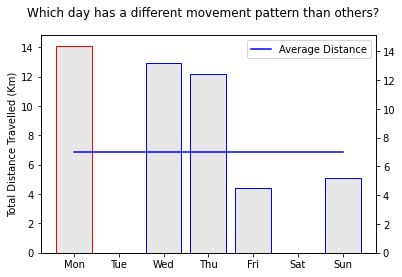

In [26]:
visualiser.plot_daywise_track(weekly_trajectories)